In [583]:
import random
import cv2 as cv
from matplotlib import pyplot as plt
import numpy as np

In [584]:
file_1 = "low_contrast.jpg"
file_2 = "light_city.jpg"
file_4 = "high_contrast.jpg"

In [585]:
def show(image):
    plt.imshow(image)
    plt.figure(figsize=(35, 25), dpi=150)
    plt.show()

In [719]:
img1 = cv.imread(file_1)
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)

In [720]:
img2 = cv.imread(file_2)
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)

In [718]:
img4 = cv.imread(file_4)
img4 = cv.cvtColor(img4, cv.COLOR_BGR2RGB)

In [613]:
def dist(x, y):
  n = len(x)
  assert len(x) == len(y)
  return sum([(x[i] ^ y[i]) for i in range(n)])

def custom_match(image1, image2):
    # ініціалізуємо детектор
    orb = cv.ORB_create()

    # знаходимо ключові точки та дескриптори зображень
    kp1, des1 = orb.detectAndCompute(image1, None)
    kp2, des2 = orb.detectAndCompute(image2, None)

    # знаходимо збіги між дескрипторами двох зображень
    matches = []
    best_match_distance = float('inf')
    for i, k1 in enumerate(des1):
        best_match = None
        best_match_distance = float('inf')
        for j, k2 in enumerate(des2):
            distance = float(dist(k1, k2))
            if distance < best_match_distance:
                best_match_distance = distance
                best_match = cv.DMatch(_distance=distance, _imgIdx=0, _queryIdx=i, _trainIdx=j)

        matches.append(best_match)

    # відбираємо збіги, що задовольняють критерію
    good_matches = []
    for match in matches:
        if match.distance < 0.7 * best_match_distance:
            good_matches.append(match)

    # малюємо зображення, що містять збіги ключових точок
    result = cv.drawMatches(image1, kp1, image2, kp2, good_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    show(result)

In [591]:
def orb_match(img, second):
    orb = cv.ORB_create()
    kp1, des1 = orb.detectAndCompute(img, None)
    kp2, des2 = orb.detectAndCompute(second, None)
    bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)

    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    img_matches = cv.drawMatches(img, kp1, second, kp2, matches[:15], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    show(img_matches)

In [592]:
def affine(img):
    img = cv.warpAffine(img, np.array([[1, -0.3, 0], [0, 1, 0]]), img1.shape[:2][::-1])
    return img

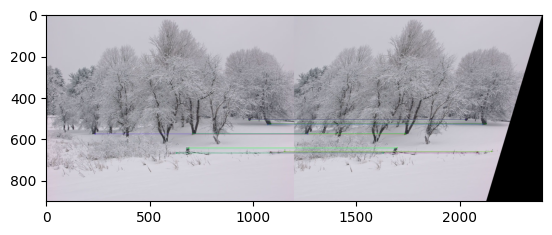

<Figure size 5250x3750 with 0 Axes>

In [595]:
orb_match(img1, affine(img1))

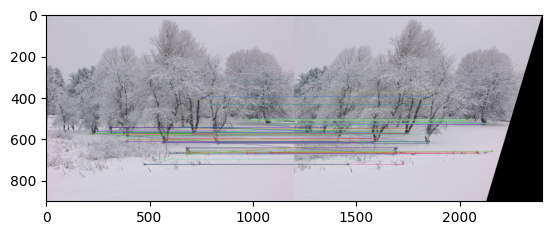

<Figure size 5250x3750 with 0 Axes>

In [614]:
custom_match(img1, affine(img1))

In [596]:
rot_1 = cv.rotate(img1, cv.ROTATE_180)

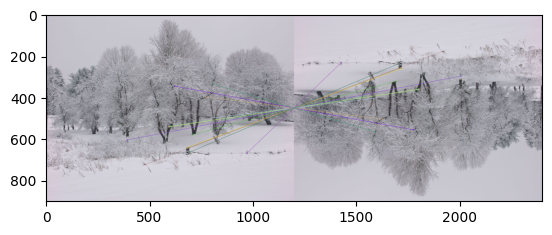

<Figure size 5250x3750 with 0 Axes>

In [598]:
orb_match(img1, rot_1)

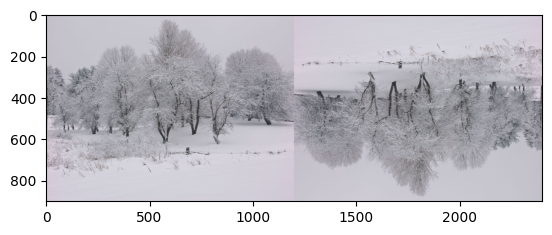

<Figure size 5250x3750 with 0 Axes>

In [615]:
custom_match(img1, rot_1)

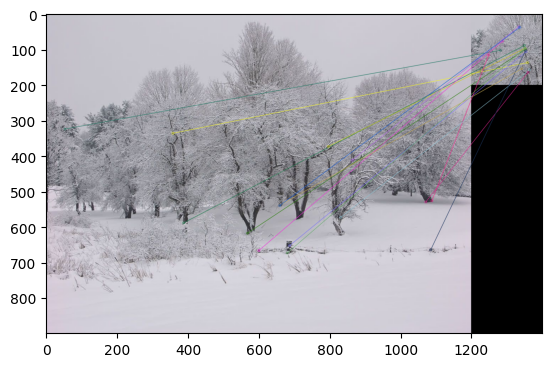

<Figure size 5250x3750 with 0 Axes>

In [599]:
crop_1 = img1[200:400, 200:400]
orb_match(img1, crop_1)

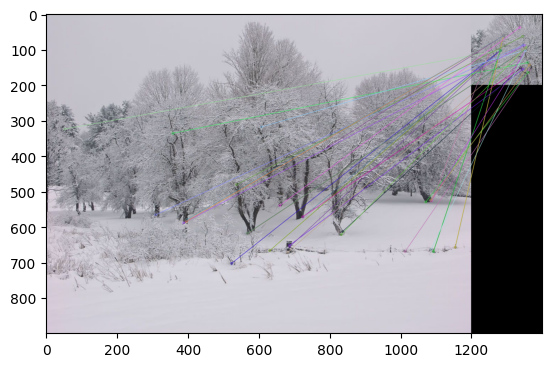

<Figure size 5250x3750 with 0 Axes>

In [616]:
custom_match(img1, crop_1)

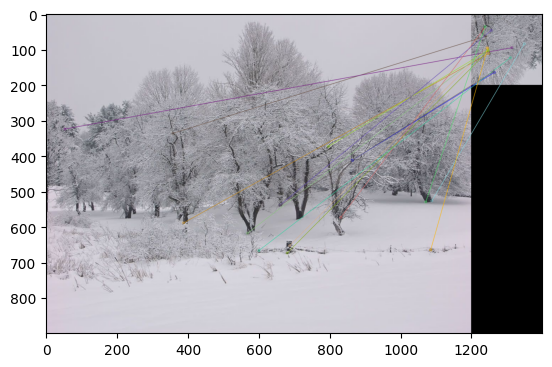

<Figure size 5250x3750 with 0 Axes>

In [600]:
query_1 = cv.rotate(crop_1, cv.ROTATE_180)
orb_match(img1, query_1)

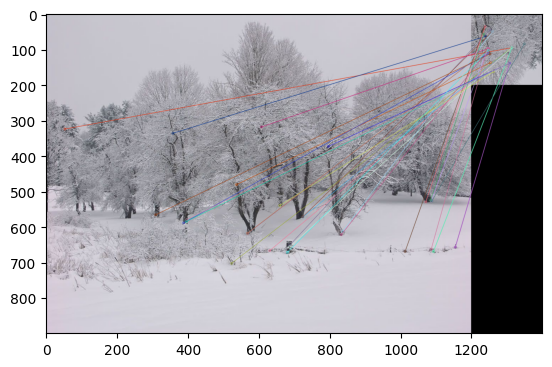

<Figure size 5250x3750 with 0 Axes>

In [617]:
custom_match(img1, query_1)

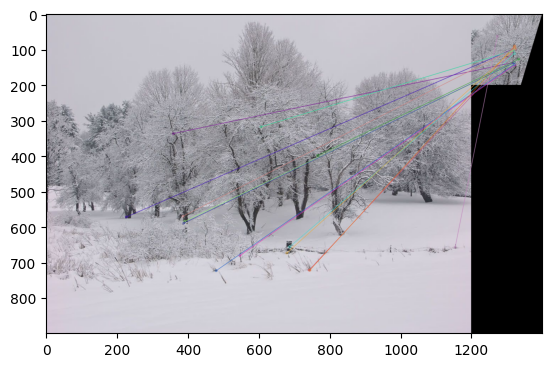

<Figure size 5250x3750 with 0 Axes>

In [602]:
query_1_2 = cv.warpAffine(crop_1, np.array([[1, -0.3, 0], [0, 1, 0]]), crop_1.shape[:2][::-1])
orb_match(img1, query_1_2)

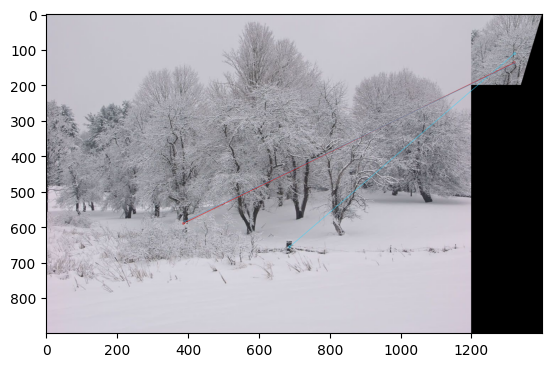

<Figure size 5250x3750 with 0 Axes>

In [618]:
custom_match(img1, query_1_2)

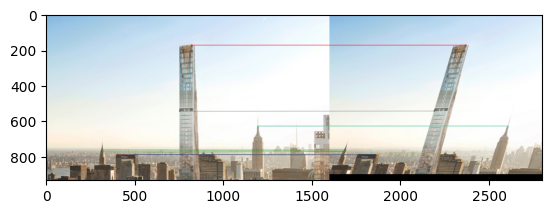

<Figure size 5250x3750 with 0 Axes>

In [619]:
orb_match(img2, affine(img2))

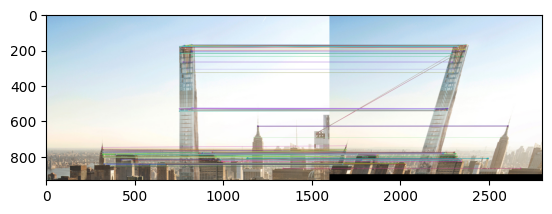

<Figure size 5250x3750 with 0 Axes>

In [621]:
custom_match(img2, affine(img2))

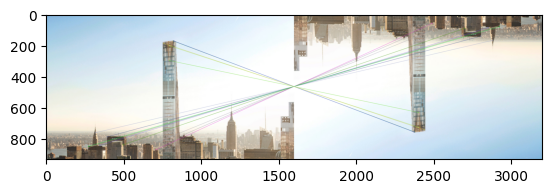

<Figure size 5250x3750 with 0 Axes>

In [620]:
rot_2 = cv.rotate(img2, cv.ROTATE_180)
orb_match(img2, rot_2)

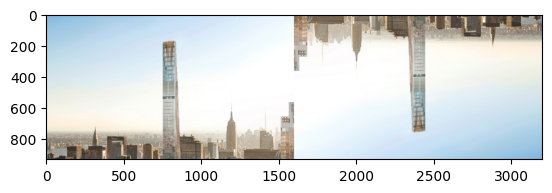

<Figure size 5250x3750 with 0 Axes>

In [622]:
custom_match(img2, rot_2)

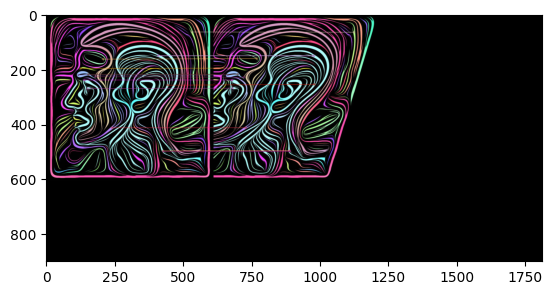

<Figure size 5250x3750 with 0 Axes>

In [682]:
orb_match(img4, affine(img4))

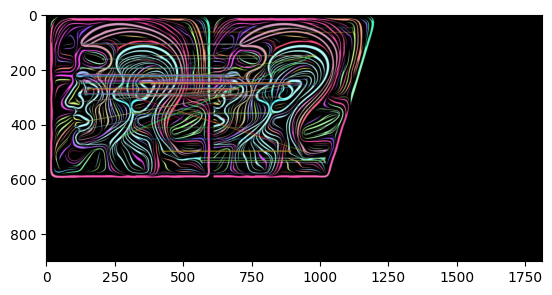

<Figure size 5250x3750 with 0 Axes>

In [683]:
custom_match(img4, affine(img4))

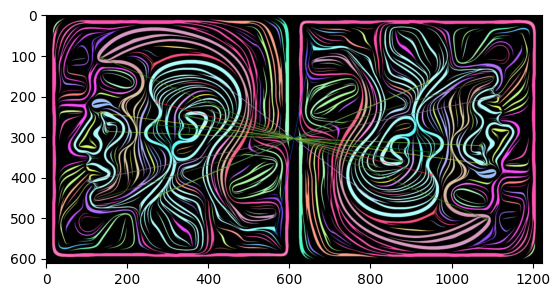

<Figure size 5250x3750 with 0 Axes>

In [684]:
rot_4 = cv.rotate(img4, cv.ROTATE_180)
orb_match(img4, rot_4)

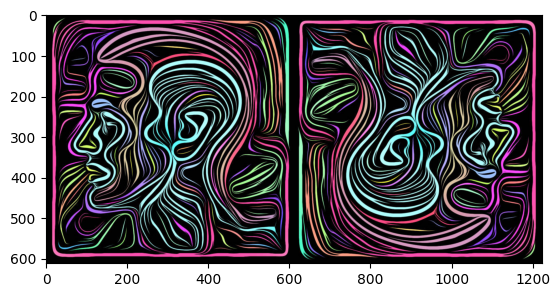

<Figure size 5250x3750 with 0 Axes>

In [685]:
custom_match(img4, rot_4)

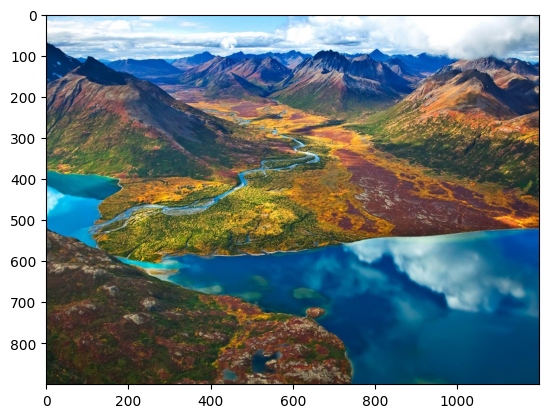

<Figure size 5250x3750 with 0 Axes>

In [687]:
file_5 = "landscape.jpg"
img5 = cv.imread(file_5)
img5 = cv.cvtColor(img5, cv.COLOR_BGR2RGB)
show(img5)

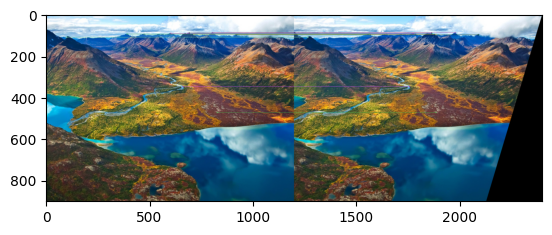

<Figure size 5250x3750 with 0 Axes>

In [688]:
orb_match(img5, affine(img5))

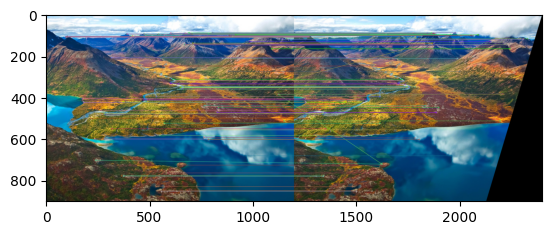

<Figure size 5250x3750 with 0 Axes>

In [689]:
custom_match(img5, affine(img5))

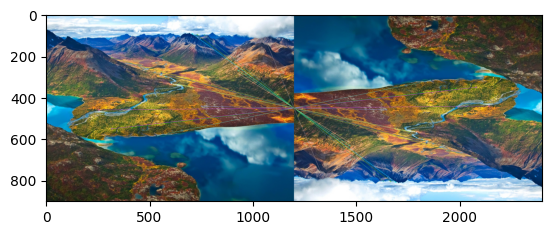

<Figure size 5250x3750 with 0 Axes>

In [690]:
rot_5 = cv.rotate(img5, cv.ROTATE_180)
orb_match(img5, rot_5)

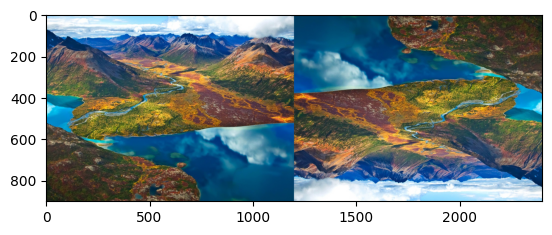

<Figure size 5250x3750 with 0 Axes>

In [691]:
custom_match(img5, rot_5)

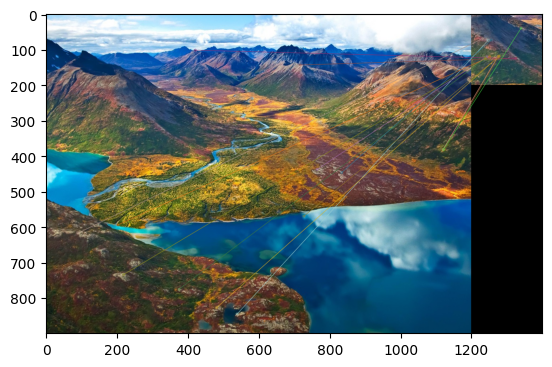

<Figure size 5250x3750 with 0 Axes>

In [693]:
crop_5 = img5[200:400, 200:400]
orb_match(img5, crop_5)

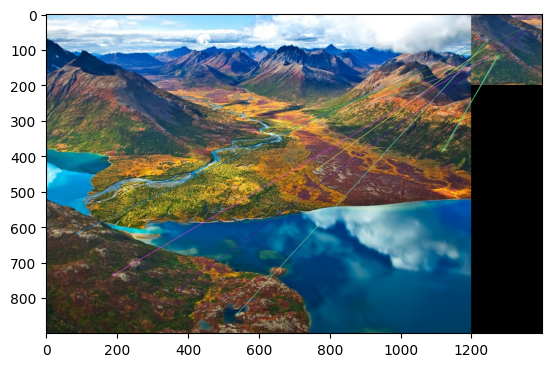

<Figure size 5250x3750 with 0 Axes>

In [694]:
custom_match(img5, crop_5)

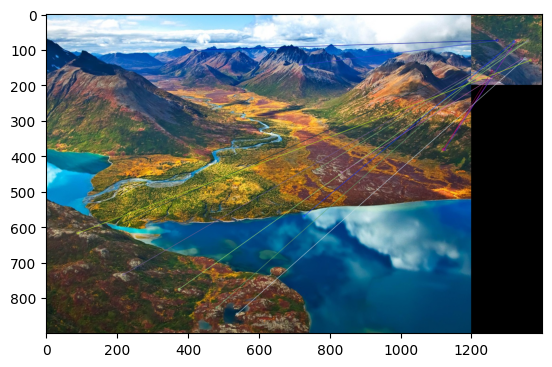

<Figure size 5250x3750 with 0 Axes>

In [695]:
query_5 = cv.rotate(crop_5, cv.ROTATE_180)
orb_match(img5, query_5)

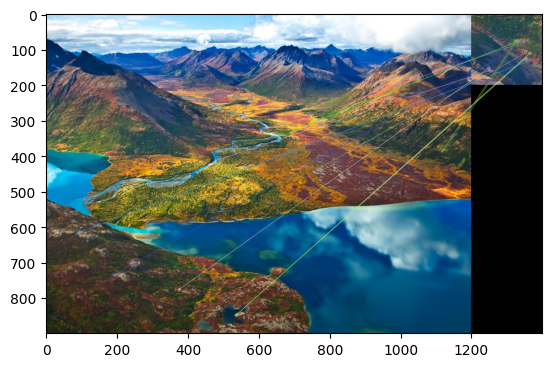

<Figure size 5250x3750 with 0 Axes>

In [696]:
custom_match(img5, query_5)

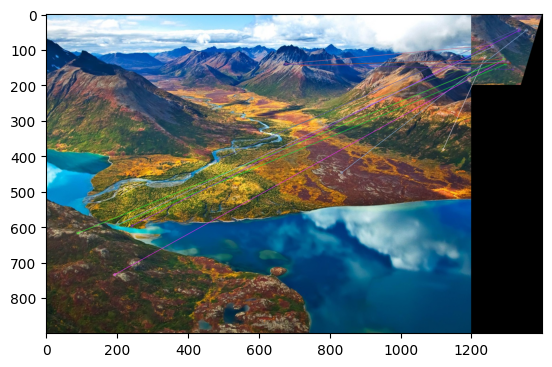

<Figure size 5250x3750 with 0 Axes>

In [697]:
query_5_2 = cv.warpAffine(crop_5, np.array([[1, -0.3, 0], [0, 1, 0]]), crop_5.shape[:2][::-1])
orb_match(img5, query_5_2)

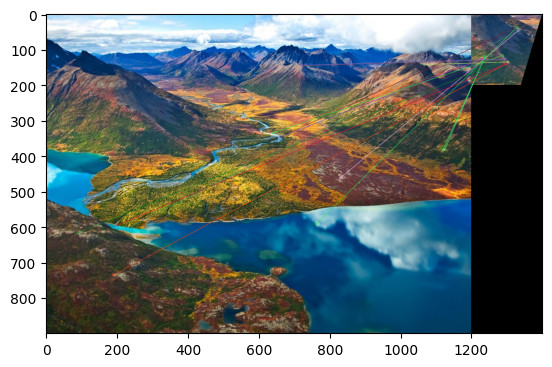

<Figure size 5250x3750 with 0 Axes>

In [698]:
custom_match(img5, query_5_2)

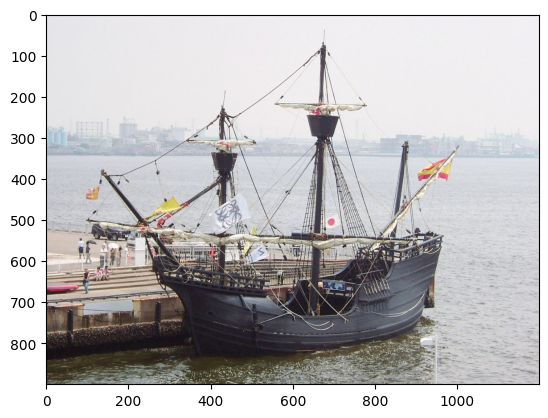

<Figure size 5250x3750 with 0 Axes>

In [711]:
file_6 = "sea2.jpg"
img6 = cv.imread(file_6)
img6 = cv.cvtColor(img6, cv.COLOR_BGR2RGB)
show(img6)

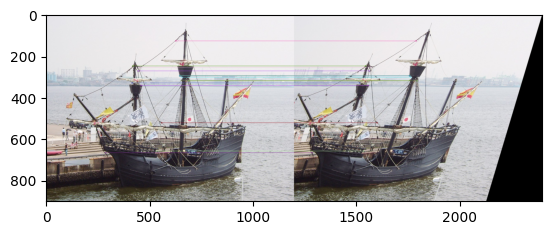

<Figure size 5250x3750 with 0 Axes>

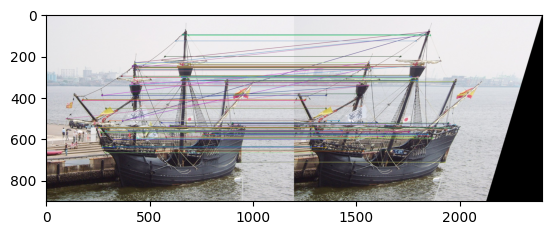

<Figure size 5250x3750 with 0 Axes>

In [712]:
orb_match(img6, affine(img6))
custom_match(img6, affine(img6))

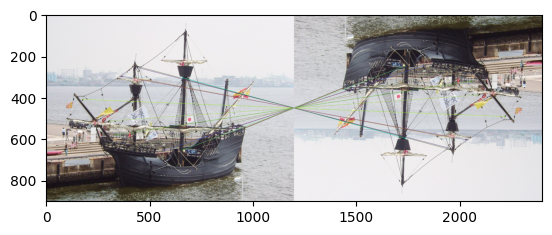

<Figure size 5250x3750 with 0 Axes>

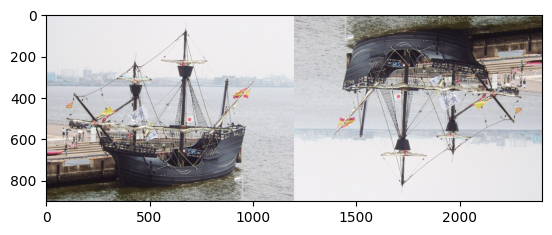

<Figure size 5250x3750 with 0 Axes>

In [713]:
rot_6 = cv.rotate(img6, cv.ROTATE_180)
orb_match(img6, rot_6)
custom_match(img6, rot_6)

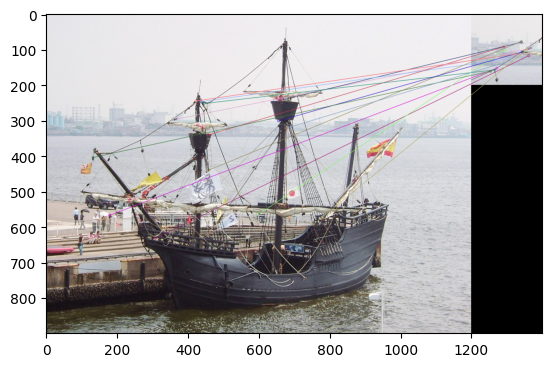

<Figure size 5250x3750 with 0 Axes>

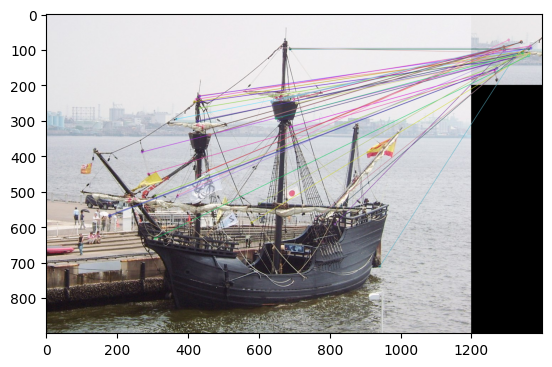

<Figure size 5250x3750 with 0 Axes>

In [714]:
crop_6 = img6[200:400, 200:400]
orb_match(img6, crop_6)
custom_match(img6, crop_6)

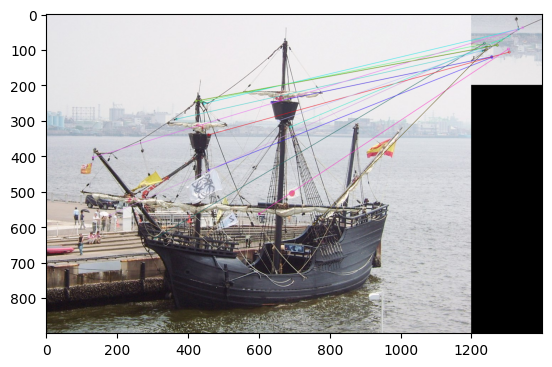

<Figure size 5250x3750 with 0 Axes>

In [715]:
query_6 = cv.rotate(crop_6, cv.ROTATE_180)
orb_match(img6, query_6)

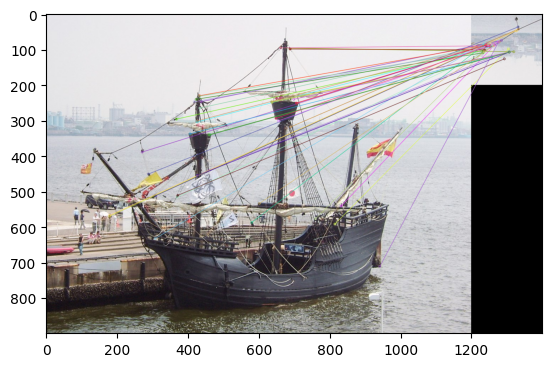

<Figure size 5250x3750 with 0 Axes>

In [716]:
custom_match(img6, query_6)

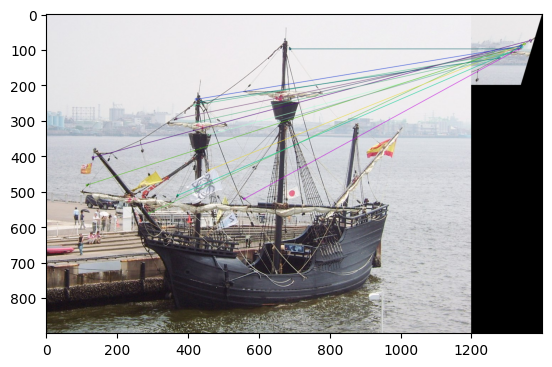

<Figure size 5250x3750 with 0 Axes>

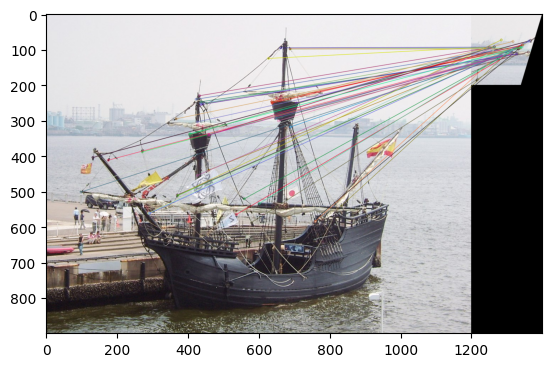

<Figure size 5250x3750 with 0 Axes>

In [717]:
query_6_2 = cv.warpAffine(crop_6, np.array([[1, -0.3, 0], [0, 1, 0]]), crop_6.shape[:2][::-1])
orb_match(img6, query_6_2)
custom_match(img6, query_6_2)